# Information thresholding for image sets

IBS: 2022_11_16

Here I am attempting to understand the indea of information theresholding for reducing the size of datasets.  This is starting with PCA, but moves on to consider the information content of datasets.  I will add some narrrative for that in the relevent section.

In [1]:
using Revise
import LinearAlgebra as LA
import Statistics as Stat

import HDF5
import Plots
import PyPlot as plt
import FFTW
import LsqFit

# My QGas tools
import QGas
import QGas.FileIO as FileIO
import QGas.NumericalTools.ImageProcessing as ImProc
import QGas.NumericalTools.ArrayDimensions as AD


# Note that somehow the section of this file doing this work got deleted!!??
# import PyCall
# np = PyCall.pyimport("numpy")

# print(abspath(PROGRAM_FILE), " ",  @__FILE__)

## Minilab MOT Dataset

Here I import the relevent packages and test that we can load and process files

In [2]:
# Messing around with h5 files
filename = homedir()*"/Downloads/0006/"*"2022-09-20_0006_SimpleMot_000.h5"

imagedict = HDF5.h5open(filename, "r") do h5_file
    print(keys(h5_file["images/MOT_x/fluorescence"]))
end

["MOT", "MOT_dark", "cMOT", "cMOT_dark"]

In [3]:
datafiles = FileIO.DataFiles(homedir()*"/Downloads/0006/"*"2022-09-20_0006_SimpleMot_", 0, 1)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d")
print(filenames)

MOT_x_grp = FileIO.ImageGroup("MOT_x", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"])
MOT_y_grp = FileIO.ImageGroup("MOT_y", "absorption", ["MOT_TOF", "MOT_TOF_dark", "MOT_TOF_probe"])
MOT_z_grp = FileIO.ImageGroup("MOT_z", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"])

["/Users/ispielma/Downloads/0006/2022-09-20_0006_SimpleMot_000.h5", "/Users/ispielma/Downloads/0006/2022-09-20_0006_SimpleMot_001.h5"]

QGas.FileIO.ImageGroup("MOT_z", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"])

As a first example, lets look at the flourscense image of a MOT

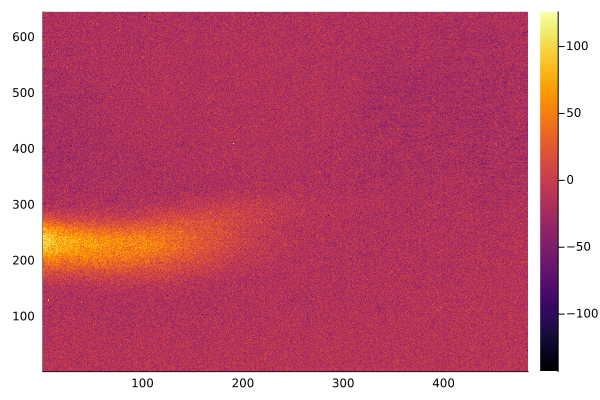

In [3]:
imagegroups = [MOT_x_grp, ];
MOT_data = FileIO.getimages(filenames[1], imagegroups)
MOT_fl_x = convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["MOT"]) - convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["cMOT_dark"]);
Plots.heatmap(MOT_fl_x)

### Analysis

OK!  We can open files.  Now I want to process a large dataset

In [6]:
filename = homedir()*"/Downloads/0006/"*"2022-09-20_0006_SimpleMot_"
datafiles = FileIO.DataFiles(filename, 0, 999)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d");

MOT_x_grp = FileIO.ImageGroup("MOT_x", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"]);
MOT_y_grp = FileIO.ImageGroup("MOT_y", "absorption", ["MOT_TOF", "MOT_TOF_dark", "MOT_TOF_probe"]);
MOT_z_grp = FileIO.ImageGroup("MOT_z", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"]);

In [7]:
shape = (size(filenames)...,size(MOT_fl_x)...)
images = zeros(Int16, shape )

for (i, file) in enumerate(filenames)
    MOT_data = FileIO.getimages(file, MOT_x_grp)
    MOT_fl_x = convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["MOT"]) - convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["cMOT_dark"])

    images[i,:,:] = MOT_fl_x
end

images_flat = reshape(images, (shape[1], shape[2]*shape[3]) );
size(images_flat)

(1000, 311696)

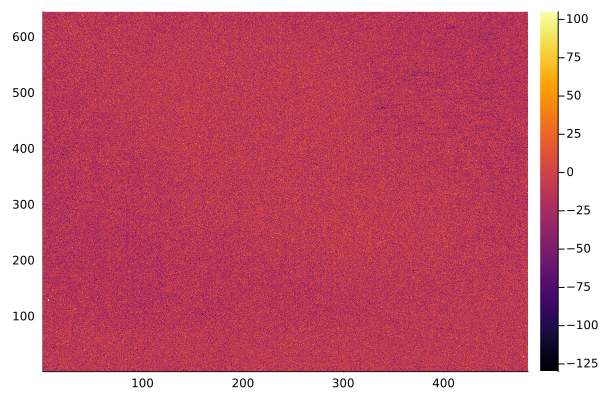

In [8]:
Plots.heatmap(images[9,:,:])

In [7]:
U, S, V = LinearAlgebra.svd(images_flat);
components = reshape(V', shape );

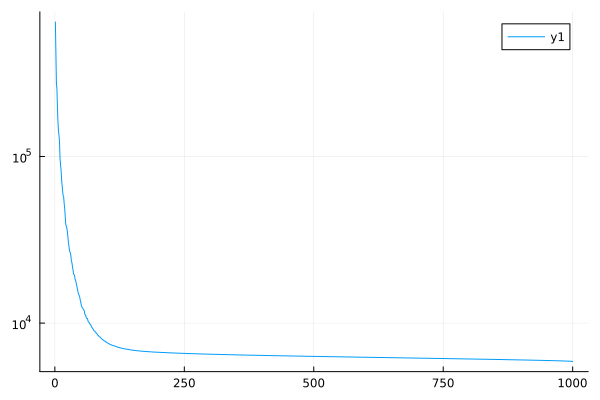

In [8]:
Plots.plot(S, yaxis=:log)

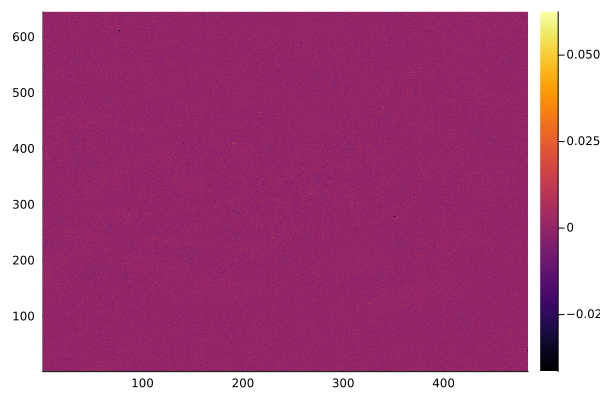

In [12]:
Plots.heatmap(components[200,:,:])

In [17]:
# Assign a variable to nothing and call gc() to free memory:

components = nothing
S = nothing
U = nothing
V = nothing
images = nothing
images_flat = nothing
GC.gc()

In [149]:
# Now I will define a function that computes the fractional closeness to random of a distribution
# I will start by computing sum (rho log rho)  for each normalized sub distribution
"""
Produces a information theory based measure of the amount of information in a distribution 
assumes the distribution is ordered from large to small and 

normalizes to the information in the full distribution
"""
function distrandom(dist)
    # First reverse the distribution
    rdist = reverse(dist)

    norms = cumsum(rdist)
    logs = log.(rdist)
    logdist = -rdist.*logs
    logdistsum = cumsum(logdist) # this would be the usual von Neuman entropy for a normalized distribution
    vonNeuman = (logdistsum)./norms .+ log.(norms)

    # Normalized to the maximum possible entropy of a distribution distribution of the given length
    vonNeumanNorm = vonNeuman ./ log.(1:size(rdist)[1]);
    vonNeumanNorm = 1 .- vonNeumanNorm

    # Lastly normalize this to its maximum
    vonNeumanNorm ./= vonNeumanNorm[1]

    return reverse(vonNeumanNorm)
end

ans = distrandom(S);


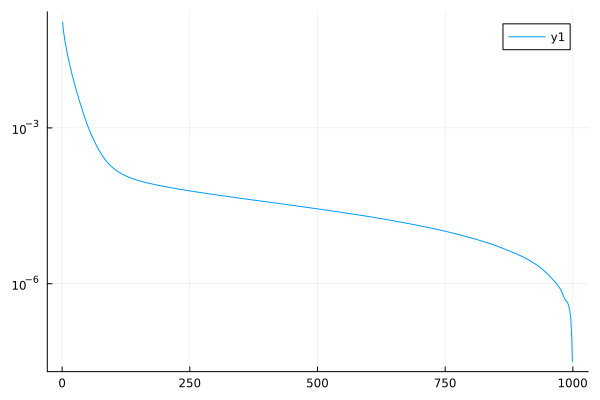

In [150]:
Plots.plot(ans, yaxis=:log)

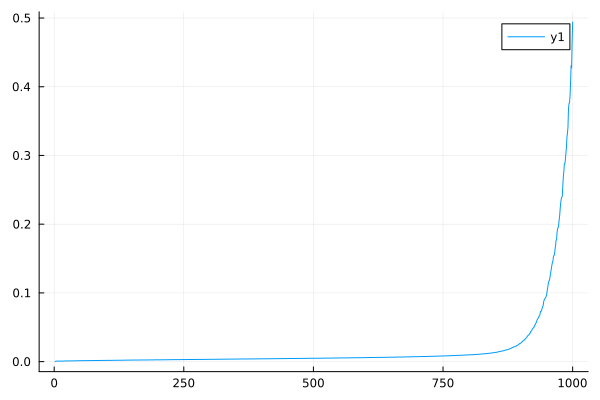

In [88]:
Plots.plot(vonNeumanNorm)


## RbK noise data

2023_01_05: Data taken by Alina on aberations of imaging system.  I am writing this section as a demon of the PCA based approach for analysis.  This version is pretty simple, and for example does not attempt to crop the image (which would otherwise be a really good idea to speed things up.)

### Single shot setup

In [3]:
# Learn the structure of the RbK h5 files
filename = homedir()*"/Downloads/0021/2023-01-03_0021_20220420_sheet_trap_249.h5"

imagedict = HDF5.h5open(filename, "r") do h5_file
    print(keys(h5_file["images/xy0"]))
end

imginfo = ImProc.ImageInfo((648, 488), (1.0, 1.0), ("μm", "μm"); filter_width=1.0);

# This is going well.  The next thing I might want to do is to be able to pass a function reference as well so that
# the filter construction can be more arbitrary and filter_width can be filter_args (and I guess I'll need a kwargs too).

["shot1", "shot2", "shot3"]

QGas.NumericalTools.ImageProcessing.ImageInfo{2}((648, 488), (1.0, 1.0), ("μm", "μm"), 1.0, QGas.NumericalTools.ImageProcessing.gauss_window, [0.7780997330454527 0.2850725516184809 … 0.2850725516184809 0.7780997330454527; 0.2853627359063349 0.10454840145395289 … 0.10454840145395289 0.2853627359063349; … ; 0.2853627359063349 0.10454840145395289 … 0.10454840145395289 0.2853627359063349; 0.7780997330454527 0.2850725516184809 … 0.2850725516184809 0.7780997330454527], (-324.0:1.001545595054096:324.0, -244.0:1.002053388090349:244.0), (-324.0:1.001545595054096:324.0, -244.0:1.002053388090349:244.0))

In [5]:
imginfo.ndrange

648×488 QGas.NumericalTools.ArrayDimensions.NDRange{2}:
 [-324.0, -244.0]    [-324.0, -242.998]    …  [-324.0, 244.0]
 [-322.998, -244.0]  [-322.998, -242.998]     [-322.998, 244.0]
 [-321.997, -244.0]  [-321.997, -242.998]     [-321.997, 244.0]
 [-320.995, -244.0]  [-320.995, -242.998]     [-320.995, 244.0]
 [-319.994, -244.0]  [-319.994, -242.998]     [-319.994, 244.0]
 [-318.992, -244.0]  [-318.992, -242.998]  …  [-318.992, 244.0]
 [-317.991, -244.0]  [-317.991, -242.998]     [-317.991, 244.0]
 [-316.989, -244.0]  [-316.989, -242.998]     [-316.989, 244.0]
 [-315.988, -244.0]  [-315.988, -242.998]     [-315.988, 244.0]
 [-314.986, -244.0]  [-314.986, -242.998]     [-314.986, 244.0]
 ⋮                                         ⋱  
 [315.988, -244.0]   [315.988, -242.998]      [315.988, 244.0]
 [316.989, -244.0]   [316.989, -242.998]   …  [316.989, 244.0]
 [317.991, -244.0]   [317.991, -242.998]      [317.991, 244.0]
 [318.992, -244.0]   [318.992, -242.998]      [318.992, 244.0]
 [319.9

In [6]:
"""
The next step past this function would use probe reconstruction, for example, to estimate the missing data, but in the end
this is not likely to matter much.

So the method would be:
    * average the dark frames and subtract as above in the simple method
    * construct a PCA basis and use M images to make the noise free probe.
    * repair that probe as above.

Next I will write the probe reconstruction and background averaging coordsperiodic

I guess I will add a keyword argument to these functions which is an estimate of the pixel-by pixel dark noise?
"""

"The next step past this function would use probe reconstruction, for example, to estimate the missing data, but in the end\nthis is not likely to matter much.\n\nSo the method would be:\n    * average the dark frames and subtract as above in the simple method\n    * construct" ⋯ 20 bytes ⋯ " M images to make the noise free probe.\n    * repair that probe as above.\n\nNext I will write the probe reconstruction and background averaging coordsperiodic\n\nI guess I will add a keyword argument to these functions which is an estimate of the pixel-by pixel dark noise?\n"

OK.  We have groups labeled "shot1", "shot2" and so forth.

In [3]:
datafiles = FileIO.DataFiles(homedir()*"/Downloads/0021/2023-01-03_0021_20220420_sheet_trap_", 0, 1)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d")

xy_grp1 = FileIO.ImageGroup("xy0", "shot1", ["atoms"])
xy_grp2 = FileIO.ImageGroup("xy0", "shot2", ["probe"])
xy_grp3 = FileIO.ImageGroup("xy0", "shot3", ["background"])

imagegroups = [xy_grp1, xy_grp2, xy_grp3]
Abs_data = FileIO.getimages(filenames[1], imagegroups);

dark = Abs_data["xy0"]["shot3"]["background"]
atoms = ImProc.preprocess_probe(Abs_data["xy0"]["shot1"]["atoms"], dark, imginfo)
probe = ImProc.preprocess_probe(Abs_data["xy0"]["shot2"]["probe"], dark, imginfo);

Now this is very strange.  Instead of placing "atoms", "probe", "background" in the same "shot" group, there is just one image per group.  I guess I thought each "shot" would be a different image set (like all of the data for absorption image 1), rather than counting the order in the experiment.

In any case, next lets setup the overall geometry for these images, and define a window / mask to reduce photon shot noise. 

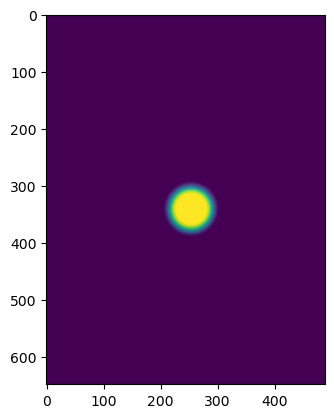

In [6]:
Abs_xy = -log.(atoms./probe)

# Generate windows for data analysis and probe reconstruction
rad = [50.0, 50.0]
cen = [17, 10]
xy = [sqrt.( sum( ((xy.-cen)./rad).^2 )) for xy in imginfo.ndrange];

window = ImProc.tukey_window(xy, 0.5; scale=0.5);
probe_window = ImProc.tukey_window(xy, 0.5; scale=0.5, min=0.1, max=1.0);

# Plots.heatmap(y, x, window )
plt.imshow(window)
plt.gcf()

Now plot the atoms with the window applied to confirm that we are not loosing atoms.

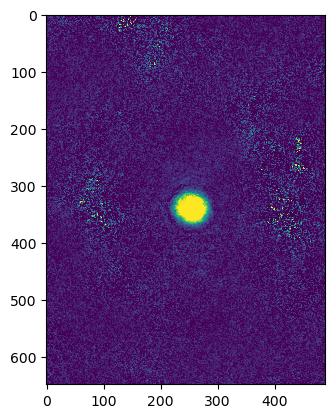

In [7]:
# Plots.heatmap(y, x, Abs_xy)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(Abs_xy, vmin=-0.05, vmax=0.5)
plt.gcf()

### Batch loading

Here we setup all of the batch loading for the whole dataset.  First build the list of files and the different data groups.

In [24]:
datafiles = FileIO.DataFiles(homedir()*"/Downloads/0021/2023-01-03_0021_20220420_sheet_trap_", 0, 249)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d")
numfiles = length(filenames)

xy_grp1 = FileIO.ImageGroup("xy0", "shot1", ["atoms"])
xy_grp2 = FileIO.ImageGroup("xy0", "shot2", ["probe"])
xy_grp3 = FileIO.ImageGroup("xy0", "shot3", ["background"])

# Notice that we are using the size of the loaded image to define this array size
shape = (size(filenames)...,size(Abs_xy)...)

probes = zeros(Float64, shape )
atoms = zeros(Float64, shape )
darks = zeros(Float64, shape )
images = zeros(Float64, shape )

for (i, file) in enumerate(filenames)
    Abs_data = FileIO.getimages(file, imagegroups)
    
    darks[i,:,:] = Abs_data["xy0"]["shot3"]["background"]
    atoms[i,:,:] = Abs_data["xy0"]["shot1"]["atoms"]
    probes[i,:,:] = Abs_data["xy0"]["shot2"]["probe"]
end

# Make average dark frame and its noise
dark, dark_std = ImProc.average_dark(darks)

# Remove dark from probe 
# a past value filtered unphysical probe and atom values
for i in 1:numfiles
     # cleaning invalid points on atoms
    atoms[i,:,:] = ImProc.preprocess_probe(atoms[i,:,:], dark, imginfo)
    probes[i,:,:] = ImProc.preprocess_probe(probes[i,:,:], dark)
end

# Perform probe reconstruction... on probes
probes_flat = reshape(probes, (shape[1], shape[2]*shape[3]) )
U, S, V = LA.svd(probes_flat)
components = reshape(V', shape );

Lets look at the magnitude of the first components to learn where a good cutoff is.

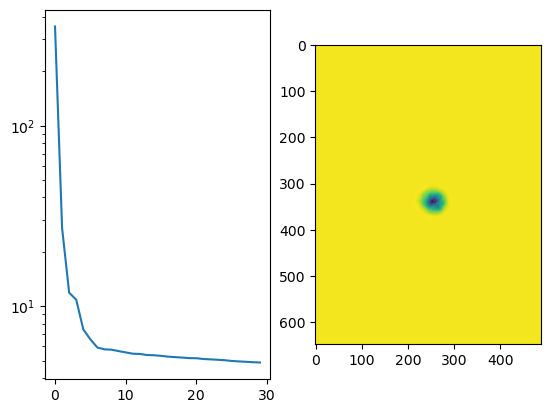

In [44]:
# Plots.plot(S[1:30], yaxis=:log)
fig = plt.figure()
ax = fig.add_subplot(121)
ax.plot(S[1:30])
ax.set_yscale("log")
ax = fig.add_subplot(122)
ax.imshow(components[1,:,:])
plt.gcf()

In [27]:
# Now build the projection onto the lowest PCs from the whole dataset
pcs = components[1:20,:,:]
probes_clean = zeros(Float64, size(probes))

for i in 1:size(probes_clean)[1]
    for j in 1:size(pcs)[1]
        pc = pcs[j,:,:]
        overlap = sum(probes[i,:,:] .* pc)
        probes_clean[i,:,:] .+=  overlap*pc
    end

    # clean negative values from the probe
    probes_clean[i,:,:] = ImProc.filter_probe(probes_clean[i,:,:], gauss)
end
probes_clean_flat = reshape(probes_clean, (shape[1], shape[2]*shape[3]) );

probes_var = (probes .- probes_clean).^2;
probes_var_flat = reshape(probes_var, (shape[1], shape[2]*shape[3]) );


Here I can use the whole dataset to quantify the relation between the mean signal and the variance is.  This is a bit different from what Emine has done only in that this is using a one esenble of nominally identicle probes.

Fitst I need to bin the data across the whole dataset

In [29]:
# Bin the data
bins = 100
step = maximum(probes_clean_flat) / bins
counts =  zeros(Int64, bins )
vars = zeros(Float64, bins)
domain = range(0,stop=maximum(probes_clean_flat),length=bins)

for (data, var) in zip(probes_clean_flat, probes_var_flat)
    j = 1 + floor(Int64, data / step)
    j = max(1, j)
    j = min(bins, j)
    counts[j] += 1
    vars[j] += var
end

counts = max.(counts, 1)
vars ./= counts # don't divide by zero
sigmas = vars ./ sqrt.(counts);

[55.0047704347494, 0.7176336170192661]

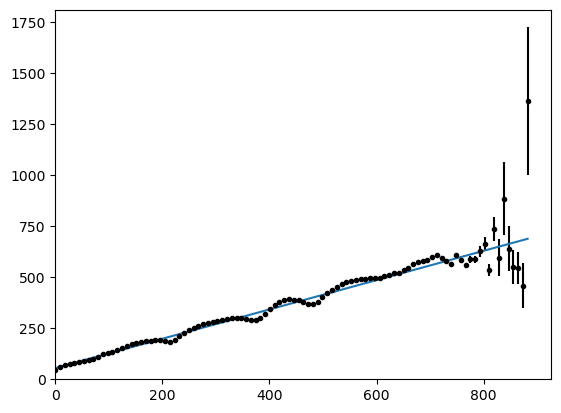

In [46]:
# Identify the noise relation for this sensor

@. model(x, p) = p[1] + x*p[2]

offset = 40.0
scale = 1.0

p0 = [offset, scale]

fit = LsqFit.curve_fit(model, domain, vars, sigmas.^-2, p0)
print(fit.param)
var_dark = fit.param[1]
var_slope = fit.param[2]

fig = plt.figure()
ax = fig.add_subplot(111)
ax.errorbar(domain, vars, yerr=sigmas, color="black", fmt=".")
ax.plot(domain, model(domain, fit.param))
ax.set_ylim([0,nothing])
ax.set_xlim([0,nothing])
plt.gcf()

### Field generation

Now I want to do something new and fancy, which is to generate statistically valid electric field realizations for each image.

The approach will be to use the cleaned images to estimate the expected noise on a pixel-by-pixel basis 

In [152]:
ΔI2 = slope_variance .* probes_clean .+ var_dark 

α  = ImProc.α_realization(probes, probes_clean, ΔI2; addnoise=true);

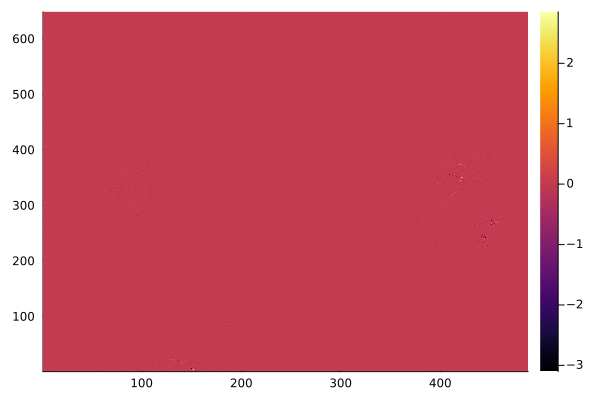

In [164]:
Plots.heatmap(angle.(α[1,:,:]))

Now we have an ensemble of fields from which I will compute the principle components.  The whole idea here had been to see they difference between the field variations versus the ones in intensity.

In [155]:
α_flat = reshape(α, (shape[1], shape[2]*shape[3]) );

# Perform SVD
U, S, V = LA.svd(α_flat)
components = reshape(V', shape );

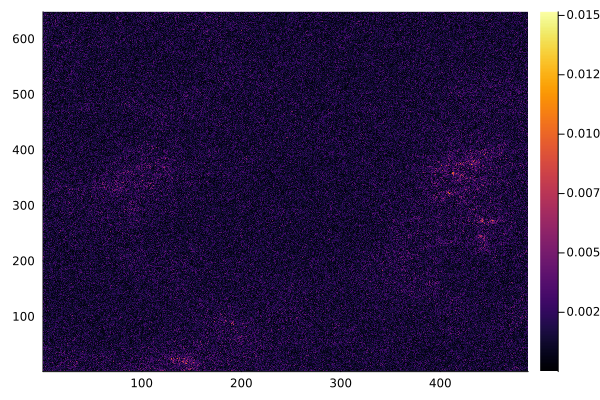

In [162]:
Plots.heatmap(abs.(-components[15,:,:]))

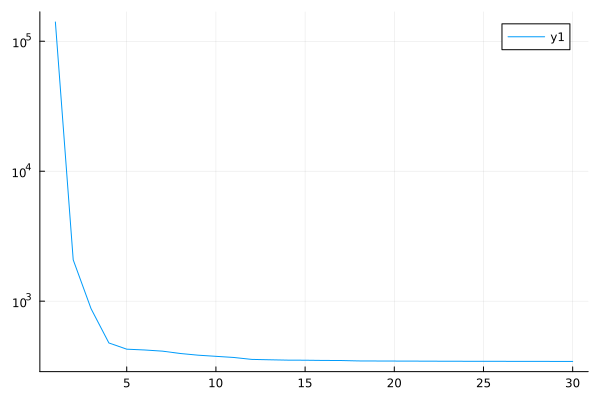

In [157]:
Plots.plot(S[1:30], yaxis=:log)

## Probe recovery

At this point we have basically implemented simplified probe recovery.  I will use this to make the OD's.  Note that the difference here is that I did not project to the atoms probe because the RbK data is taken so fast that there is no problem.

In [31]:
# Construct abs images
for i in 1:numfiles
    Abs_xy = -log.(atoms[i,:,:] ./ probes_clean[i,:,:])
    images[i,:,:] = Abs_xy .* window
end

images_flat = reshape(images, (shape[1], shape[2]*shape[3]) )
size(images_flat)

(250, 316224)

At this point we have the abs images using the and now will _again_ do svd to remove the background density from the atoms images

In [33]:
# Perform density reconstruction
U, S, V = LA.svd(images_flat)
components = reshape(V', shape );

So it looks like a cutoff of 8 will work very well.

Next subtract off the first 8 components from the images.

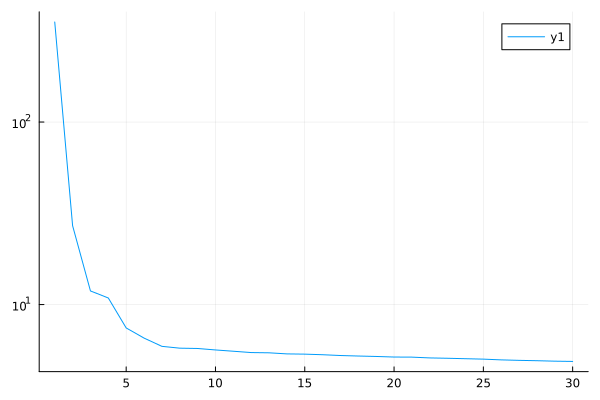

In [34]:
Plots.plot(S[1:30], yaxis=:log)

In [35]:
# Now subtract the projection onto the lowest 8 PCs from the whole dataset
pcs = components[1:8,:,:]
cleaned = copy(images)
for i in 1:size(cleaned)[1]
    for j in  1:size(pcs)[1]
        pc = pcs[j,:,:]
        overlap = sum(images[i,:,:] .* pc)
        cleaned[i,:,:] .-=  overlap*pc
    end
end

And see how the cleaned images look.

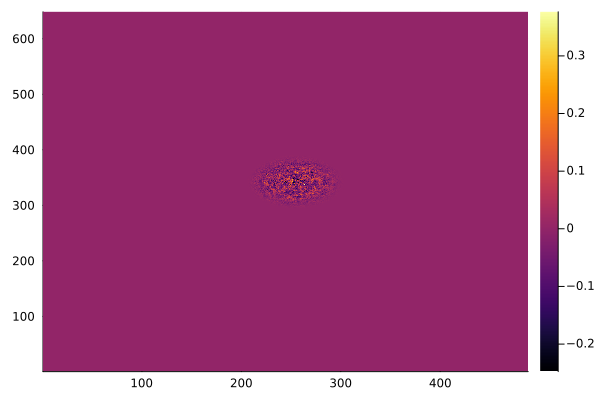

In [36]:
Plots.heatmap(cleaned[10,:,:])

### PSD

Having generated background subtracted images we conclude by generating the desired PSD and k values.

In [37]:
# Now compute the averaged PSD.  For this I need the FFT.
PSD = zeros(Float64, size(cleaned[1,:,:])) 
for i in 1:size(cleaned)[1]
    PSD .+= abs.(FFTW.fftshift(FFTW.fft(cleaned[i,:,:]))).^2
end
PSD /= size(cleaned)[1];

Now plot the data.  Note that I am _not_ including the $2\pi$ so we have ``true'' inverse microns.

NA Estimate 0.21084337349397592 but Amilson found 0.17

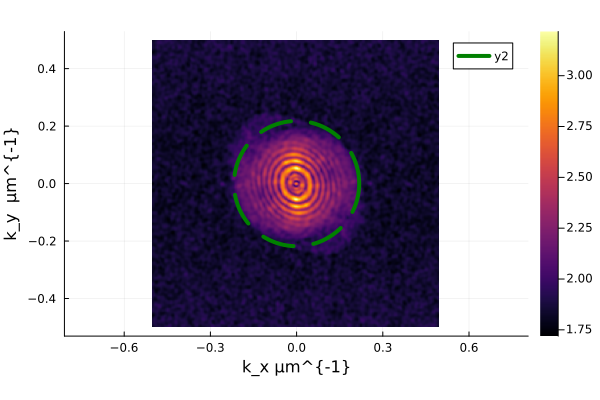

In [38]:
# Plot the data with units and add a k_na circle
# note that these units are inverse microns without the 2π

# Axes without the 2π
kxs = FFTW.fftshift(FFTW.fftfreq(size(PSD)[1],1/dx)); # no 2π here
kys = FFTW.fftshift(FFTW.fftfreq(size(PSD)[2],1/dx)); # no 2π here

# make a circle
# rad = 1e-6*(1/780e-9)*(17.5/83.0) # effective NA from r = 17.5 = 35 / 2 and f = 83 , the 2π over λ is omitted
rad = 1e-6*(1/780e-9)*0.17 # Amilson NA

print("NA Estimate $(17.5/83.0) but Amilson found 0.17")
circle_x = [ rad*cos(θ) for θ in range(0,2*π; length=100)]
circle_y = [ rad*sin(θ) for θ in range(0,2*π; length=100)]

# Plot the data
p1 = Plots.heatmap(kys, kxs, PSD.^0.25; aspect_ratio=:equal)
p1 = Plots.plot!(p1, circle_x, circle_y,line=:dash, lc=:green, lw=4)

p1 = Plots.xlabel!(p1, "k_x μm^{-1}")
p1 = Plots.ylabel!(p1, "k_y  μm^{-1}")
Plots.savefig(p1, "2023_01_12_RbK_k_na.pdf")
p1


One thing that is hard to document is the change resulting froming improvements.  I recently added probe reconstruction to this code and as expected, the noise from photon shot noise greatly decreased (as evicenced by the noise outside the NA circle)

It is difficult to tell, but it looks to me that the imaging might also be slightly detuned (because on resonance we should see modulations like $\cos k^2$, with a defocus dependent scale factor), and there may be a phase shift here.  In addition, the circles are not quite round, indicating an astgmatism.  And they seem tilted suggesting the camara is rotated slightly (or the beam has not been aligned with careful right angles and fixed height above the optical table.)

We see that the intensity ends slightly inside the green circle.  This leads me to believe that the magnification is slightly higher so that the effective pixel size is closer to $0.8\ \mu m$ rather than $1.0\ \mu m$.  I change this and we get

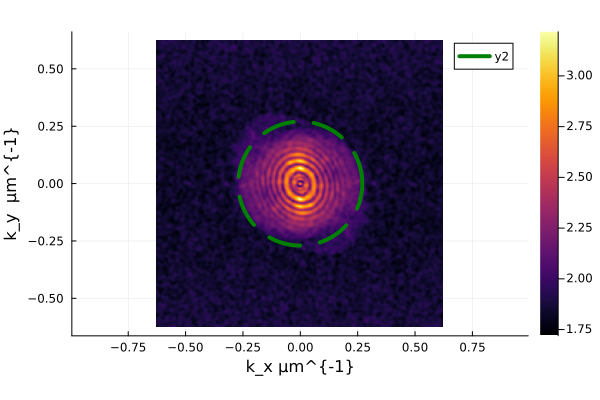

In [39]:
dx2 = 0.8

kxs = FFTW.fftshift(FFTW.fftfreq(size(PSD)[1],1/dx2)); # no 2π here
kys = FFTW.fftshift(FFTW.fftfreq(size(PSD)[2],1/dx2)); # no 2π here

# make a circle
rad = 1e-6*(1/780e-9)*(17.5/83.0) # effective NA from r = 17.5 = 35 / 2 and f = 83 , the 2π over λ is omitted
circle_x = [ rad*cos(θ) for θ in range(0,2*π; length=100)]
circle_y = [ rad*sin(θ) for θ in range(0,2*π; length=100)]

# Plot the data
p1 = Plots.heatmap(kys, kxs, PSD.^0.25; aspect_ratio=:equal)
p1 = Plots.plot!(p1, circle_x, circle_y,line=:dash, lc=:green, lw=4)
p1 = Plots.xlabel!(p1, "k_x μm^{-1}")
p1 = Plots.ylabel!(p1, "k_y  μm^{-1}")
Plots.savefig(p1, "2023_01_12_RbK_k_na.pdf")
p1